<a href="https://colab.research.google.com/github/Vale864/Causal_Impact_Airline_Fare/blob/main/airline_readme.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from IPython.display import Image, display
bsts_plots = '/content/drive/MyDrive/AirlineData/counterfactual_trend_plots'
scm_plots = '/content/drive/MyDrive/AirlineData/scm_plots'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Delta Basic Economy: A Causal Impact Analysis on Pricing Strategy

# Executive Summary

### Project Overview
In 2012, Delta Air Lines introduced a pilot program for a new fare class called "Basic Economy," as part of a price segmentation strategy designed to compete with Low-Cost Carriers (LCCs) like Spirit without cannibalizing premium revenue.

This project leverages Bayesian causal inference to quantify the financial impact of this new fare class in the initial test markets. Unlike a standard A/B test, Basic Economy could not be tested in a controlled manner. For example, it would not have been fair for Delta to randomly select a sample of people to offer the new fare to. Instead, they had to roll out the offer to everyone within a select market, making this a complex observational study that required rigorous counterfactual modeling to isolate the true treatment effect from market noise.

### STAR Breakdown

* **Situation:** The airline industry faced a paradigm shift in 2012 as legacy carriers struggled to compete with LCCs on price. Delta needed a way to segment price-sensitive customers without lowering prices across the board.

* **Task:** My objective was to rigorously determine if Basic Economy caused a credible lift in revenue, or if observed growth was merely a result of post-recession economic recovery.

* **Action:**
    * **Data Engineering:** Extracted and processed millions of rows of flight data from the US Department of Transportation's DB1B (Airline Origin and Destination Survey) dataset.
    * **Modeling:** Implemented a Bayesian Structural Time Series (BSTS) model using PyMC to construct a counterfactual based on pre-treatment trends and seasonality.
    * **Validation:** Utilized a Multivariate Synthetic Control (SCM) as a secondary validation method, creating a weighted "Synthetic Delta" from a donor pool of untreated competitor routes. While the Average Treatment Effects do not reach statistical significance at the 94% HDI level, the model demonstrates strong utility in controlling for macroeconomic confounders. The SCM model estimated a 3.6% lift in yield while preserving market share (+0.43pp) averaged across all treated routes.

* **Result:** The analysis confirmed the strategy was highly accretive and competitively effective. Results for the DTW-FLL route:
    * **Revenue Lift:** Estimated a 1.8 million cumulative revenue increase over the treatment period against the counterfactual, with an average quarterly lift of ~200k.
    * **Statistical Certainty:** The model produced a >99.9% probability of positive impact, with the 94% High Density Interval (HDI) remaining strictly positive.
    * **Competitive Defense:** Simultaneously identified a 0.63 million revenue contraction for the primary competitor (Spirit) on the same route, indicating the strategy successfully diverted price-sensitive demand away from the LCCs.

### Tech Stack
* **Language:** Python 3.10+
* **Libraries:** PyMC, ArviZ, Pandas, NumPy, Matplotlib/Seaborn
* **Data Source:** US DOT DB1B Market Data

### Methodology Note
Why **PyMC**? Standard regression techniques often fail to account for the temporal structure and evolving variance of airline data. By using a Bayesian approach, I generated **Credible Intervals** (uncertainty bands) around the impact estimates, yielding a more robust risk assessment than simple point estimates.

---
*Author: Austin Woolston*
*Connect with me on [LinkedIn](www.linkedin.com/in/austin-woolston-0a3a1a255)*

---

# Detailed Project Summary

## Project Motivation

### Brief Introduction to CI

It may be helpful to contextualize Causal Inference (CI) within the broader landscape of data science. Think of CI as occupying a space on a sliding scale of methods we can use to answer the age-old question of how changes in one variable influence another. On the far left are less robust but easy-to-implement methods, like basic associative statistics. On the far right are robust but operationally difficult methods, like the Randomized Controlled Trial (RCT). CI methods sit somewhere in the middle, although RCT is technically considered CI. This analogy can also be useful as it helps us think strategically about the methods we deploy, as there are often diminishing returns to the benefits we receive in either direction. In practice, however, it's often not a matter of thinking about trade-offs as they are not always substitutes.

One does not simply make a causal claim. The ideal way to determine the effect of an intervention, such as smoking, on a population would be to simulate a parallel reality that perfectly matches this one, with the only difference being that the roles of smokers and non-smokers are swapped. In causal theory, this is known as the "Fundamental Problem of Causal Inference"—we simply cannot observe the counterfactual.

While RCTs are the gold standard for canceling out these differences, they are often costly, infeasible, or unethical to implement (e.g., randomly assigning people to smoke). This is where CI steps in. It allows us to simulate that "parallel reality" using formalized structures and domain knowledge. It uses tools like Directed Acyclic Graphs (DAGs) or Structural Equation Models (SEMs) to represent the Data Generating Process (DGP), and by making strong, transparent assumptions, we can infer causality without an RCT.

**Prediction vs. Causation**

A large amount of contemporary data science and machine learning (ML) relies on correlations to form predictions. However, relying solely on correlations is, as I’ve heard it described, "effectively driving by looking in the rearview mirror." The model can tell you what is likely to happen, but it cannot tell you how to change that outcome. CI attempts to answer a deeper set of questions: it is not concerned with what will happen, but what would happen if an intervention were made. It is the science of estimating the real effect of an action.

**The Human Element**

In theory, this sounds great, but the necessary assumptions, diagrams, and domain knowledge introduce a layer of methodological rigor and complexity. In short, there is no `sklearn.fit().predict()` equivalent for causal inference; it cannot be easily automated. This substantial methodological investment, however, is precisely where its value lies.

One of the biggest friction points in data science is the translation of value between technical teams and decision-makers. CI helps ameliorate this friction by leveraging the preexisting condition that humans share a common language: thinking causally. It is much easier to walk a stakeholder through a causal diagram than to explain why they should trust the weights of a neural network. This transparency helps break down the language barrier, allowing expert domain knowledge to flow into the models.

My choice of PyMC for this project was made with this idea in mind, as it also harnesses the synergy between data science and domain expertise. By incorporating a Bayesian framework into causal inference, I can use domain expertise to form "priors," explicitly mathematically encoding business knowledge into the model.

### Strategic Value

**Prediction as a Commodity**

To understand the strategic relevance of this project, it is helpful to view AI/ML through the economic lens proposed by Ajay Agrawal, Joshua Gans, and Avi Goldfarb in Prediction Machines. The authors argue that technological revolutions are driven by a collapse in the price of a fundamental input. Just as the internet made communication cheap, modern ML makes prediction cheap. They define prediction in a specific, economic way:

"Taking information you have to generate information you don't have."

They further demystify the limits of what this commodity brings us:

"The new wave of artificial intelligence does not actually bring us intelligence but instead a critical component of intelligence: prediction."

"Prediction is not a decision. It is a component of a decision. The other component is judgment."

Using this framework, the current trend in the cost of prediction—seemingly asymptotically approaching zero—has clear economic implications: as the cost of machine prediction decreases, the value of its substitutes (human prediction) declines, while the value of its complements (Data and Human Judgment) increases.

**The Epistemological Gap**

However, cheap prediction creates a strategic trap. As platforms like AutoML become ubiquitous, the ability to generate high-accuracy predictive models is becoming less of a differentiator for growth. A focus solely on prediction overlooks a critical distinction highlighted by physicist David Deutsch in The Beginning of Infinity: prediction is not explanation.

Deutsch argues that predictive systems (like the turkey that predicts it will be fed every day until Thanksgiving) are brittle because they lack an explanatory model of the underlying causes. He extends this critique to decision-making:

“It is a mistake to conceive of choice and decision-making as a process of selecting from existing options according to a fixed formula. That omits the most important element of decision-making, namely the creation of new options.”

For Deutsch, knowledge is not derived from observation alone (empiricism) or repeated experience (inductivism). Instead, it is the product of creative conjecture and criticism—a uniquely human capacity to create "good explanations."

This philosophy parallels the work of Judea Pearl, the "Godfather of Causality." While Deutsch argues for the necessity of explanation in science, Pearl provides the mathematical formalism to achieve it. In The Book of Why, Pearl argues that answering the most important questions (cause and effect) requires a crucial leap beyond data: the injection of qualitative causal knowledge.

“If I could sum up the message of this book in one pithy phrase, it would be that you are smarter than your data. Data do not understand causes and effects; humans do.”

Deutsch would say that creating a "good explanation" is difficult precisely because it requires engaging with an objective reality that defies prior expectations. This engagement is the essence of causal inference.

**The Arbitrage Opportunity**

This project identifies an arbitrage opportunity between these two frameworks. While the scalability of prediction is indisputable, the current data science market has arguably over-indexed on it, leaving significant value to be captured through causal explanations. Bayesian Causal Inference serves as the bridge between Agrawal’s economy and Deutsch’s epistemology:

1. Automating the "What" (Agrawal): I leverage the computational power of modern sampling (MCMC) to handle the statistical heavy lifting.

2. Encoding the "Why" (Deutsch/Pearl): Unlike "black box" ML, this project requires the explicit encoding of human judgment via Directed Acyclic Graphs (DAGs) and prior distributions.

The amount of knowledge we can derive from data is naturally finite unless we move beyond mere observation to create new falsifiable explanations. In a world of cheap prediction, the ability to mathematically model judgment and causation to simulate entirely new strategic options is the remaining frontier for value creation.

### Why This Project?

With that context established, we can look at why I chose this specific project.

Before starting, I had a keen interest in causal inference but limited practical experience. I also have a background in Economics, where one of my favorite courses was Industrial Organization. Understanding how firms compete is a complex, high-stakes problem that deserves attention.

I noticed that many causal inference applications I encountered focused on areas such as marketing (e.g., ad lift) or epidemiology. It occurred to me that CI might be suitable for gaining insights into the opaque, dynamic game of market competition. So I decided to explore its application in a less mainstream domain: competitive intelligence.

I chose to investigate the airline industry—a highly competitive and data-rich environment—to measure the real-world impact of a major strategic decision: Delta Air Lines' introduction of the "Basic Economy" fare. This scenario provided the perfect natural experiment to test how effective CI methods can be at dealing with strategic competitive analysis.

Recognizing that a full causal map of a dynamic competitive game is infeasible for a solo project, I deliberately scoped the analysis. **My aim is not to untangle every latent causal relationship, but to evaluate the practical effectiveness of modern CI techniques (Synthetic Control, BSTS) against a high-stakes, real-world competitive event.** This demonstrates a crucial skill: the ability to select and apply powerful statistical tools appropriate to the complexity and data constraints of a real-world business problem.

## Project Overview & Methodology

This project uses causal inference techniques to measure the financial and competitive impact of Delta Air Lines' (DL) Basic Economy fare introduction in 2012-Q1. The analysis focuses on three distinct Key Performance Indicators: Market Share, Yield (Revenue per RPM), and Total Segment Revenue.

The analysis is a two-part study:

1. **Bayesian Structural Time Series (BSTS):** A structural analysis of the key DTW-FLL route. This hierarchical Bayesian model utilizes a Total Segment Revenue metric to approximate the area under the market demand curve (Riemann sum). By estimating a counterfactual based on stochastic trends, this model isolates Yield Efficiency to determine if the segmentation strategy successfully extracted consumer surplus (lifted the revenue curve) or merely increased volume at the expense of price.

2. **Multivariate Synthetic Control (SCM):** A Bayesian synthetic control model constructs a "Synthetic Delta" from a weighted donor pool of untreated routes operated by legacy competitors (American Airlines and US Airways). This serves as a competitive benchmark to measure the causal impact on standard industry metrics—Market Share and Yield—simultaneously.

## 1. Data Sourcing & Preparation

**It is important to note that the DB1B dataset is limited to quarterly intervals. This level of aggregation restricts the analysis’s precision and naturally raises the uncertainty in the time-series estimates.**

### 1.1 Data Source: DB1B

The core dataset for this project is the Airline Origin and Destination Survey (DB1B) from the Bureau of Transportation and Statistics (BTS). This is a 10% random sample of all domestic airline tickets. For this analysis, the DB1B Market table was used, as it provides aggregated data for each carrier on a specific route (Origin-Destination) for each quarter.

I found the following academic research paper that investigated the data quality of DB1B. Its also a good place to start if your looking to learn more about the data in general.

- Link: https://backoffice.biblio.ugent.be/download/8634552/8639445

While the DB1B is a premier, publicly available source, it has known data quality issues. A key finding from that academic research paper is that while inconsistencies exist, "this is somewhat less pronounced for important routes and airports," which supports its use for this study of high-volume Delta hub routes.


### 1.2 Data Cleaning & Merger Recoding

A significant part of the data preparation (detailed in the **airline_db1b_data.ipynb** notebook) involved cleaning and standardizing the carrier data. The study period (2008-2014) was a time of massive consolidation in the US airline industry. To create consistent time-series data for "carriers" as economic entities, data from merged airlines was recoded to the acquiring carrier starting from the quarter of the merger's closing date. This prevents treating two merging carriers as competitors when they were, for all economic and pricing purposes, a single enterprise.

| Merger | Announcement Date | Regulatory Approval Date | Closing Date | Single Operating Certificate (SOC) Date | Official DB1B Joint Reporting Date |
|:---|:---|:---|:---|:---|:---|
| Delta & Northwest | April 14, 2008 | October 29, 2008 | October 29, 2008 | December 31, 2009 | January 2010 |
| United & Continental | May 3, 2010 | August 27, 2010 | October 1, 2010 | November 30, 2011 | January 2012 |
| Southwest & AirTran | September 27, 2010 | April 26, 2011 | May 2, 2011 | March 1, 2012 | January 2015 |
| American & US Airways | February 14, 2013 | November 12, 2013 | December 9, 2013 | April 8, 2015 | July 2015 |

## 2. Key Performance Indicators (KPIs)

To measure the policy's impact, three primary KPIs were constructed. The first two (Market Share and Yield) are standard industry metrics used for the SCM analysis to benchmark competitive performance. The third (Total Segment Revenue) is a structural metric used for the BSTS analysis to isolate pricing power across the demand curve.

**2.1 Market Share**

This measures a carrier's competitive dominance and passenger volume on a route. It is calculated as the ratio of a carrier's total passengers to the total passengers of all carriers in that market for that quarter.

- Model Usage: For the SCM model, this KPI is transformed using a Logit function to map the $[0, 1]$ bounded share to a normal distribution.

$$\text{Market Share}_{rt} = \frac{\text{Passengers}_{rt}}{\sum_{c \in \text{Carriers}} (\text{Passengers}_{c,rt})}$$

**2.2 Yield**

Yield is the airline industry's standard measure of efficiency. It is calculated by dividing total passenger revenue by Revenue Passenger Miles (RPMs), representing the average revenue earned per passenger-mile of production. This metric controls for distance, allowing for fair comparisons between routes of different lengths.

- Model Usage: For the SCM model, this KPI is transformed using a Natural Log (Log_Yield) to stabilize variance and handle its positive-only nature.

$$\text{AggYield}_{rt} = \frac{\sum_{i \in rt} (\text{MktFare}_i \times \text{Passengers}_i)}{\sum_{i \in rt} (\text{MktMilesFlown}_i \times \text{Passengers}_i)}$$(Where $rt$ represents the specific Route-Carrier-Year-Quarter grouping).

**2.3 Total Segment Revenue**

To measure pricing power beyond simple ticket volume, this metric aggregates the total revenue generated across ten distinct price quantiles. Mathematically, this serves as a Riemann sum approximation of the area under the market demand curve. This allows the analysis to detect "Yield Efficiency"—specifically, whether the carrier successfully shifted the entire revenue curve upward rather than just selling more low-fare inventory.

- Model Usage: For the BSTS model, this KPI is transformed using a Natural Log (Log_Revenue) to interpret coefficients as semi-elasticities (percentage changes).

$$\text{Total Segment Revenue}_{t} = \sum_{q=1}^{10} (\text{Revenue}_{q,t})$$(Where $q$ represents the specific price quantile bucket).

## 3. Analysis 1: Bayesian Structural Time Series

The first analysis, detailed in **airline_counterfactual_trend.ipynb**, performs a granular look into one of the most competitive routes in the trial run, DTW-FLL, to see how the fare structure was affected.

### 3.1 Objective

This analysis compares Delta (DL), the treated carrier, with its primary Ultra-Low-Cost-Carrier (ULCC) competitor, Spirit Airlines (NK), on the DTW-FLL route. The goal is to estimate what Delta's and Spirit's revenue generation would have been without the introduction of Basic Economy.

Notably, Delta called its basic economy fare the “Spirit-match fare” during an earnings call in 2015. This term explicitly acknowledges that Delta’s move was a defensive segmentation strategy aimed at competing with the price structure of ULCCs like Spirit.

### 3.2 Methodology
Instead of creating a synthetic control from other routes, this model generates a counterfactual based solely on the carrier's own pre-treatment history.

1. **Data:** The dtw_fll_df is aggregated into 10 deciles (Quantiles 0-9) based on the price distribution of the market for each quarter. These 10 quantiles represent the structure of the market demand curve. By summing the revenue for each carrier's contribution to each quantile, we calculate Total Segment Revenue. This metric acts as a Riemann sum approximation of the area under the demand curve, allowing us to isolate "Yield Efficiency" (shifting the curve up) from simple volume growth.

2. **Model:** A hierarchical Bayesian model is built in PyMC to model the revenue in each of the 10 quantiles. The model estimates a deterministic linear_trend to capture the overall growth trajectory, a seasonal effect (quarter_mu) to handle travel cyclicality, and a specific baseline intercept for each quantile (quantile_mu).

3. **Counterfactual:** The model is trained only on the pre-treatment data (2008-Q4 to 2011-Q4). It is then used to predict the revenue for the post-treatment period (2012-Q1 to 2014-Q2). This prediction serves as the "counterfactual trend."

4. **Impact:** The causal impact is calculated as the difference between the actual observed revenue and the predicted counterfactual revenue for each quantile. This provides a rich, detailed view of the policy's effect across the entire fare ladder.

### 3.3 Route Selection
The DTW-FLL route was selected out of Delta's test routes for this analysis based on two strategic criteria:

1. **High Leisure Volume:** As a primary leisure destination, this route exhibits high price elasticity. This maximizes the probability of detecting a measurable effect from the introduction of the 'Basic Economy' fare class, which specifically targets price-sensitive leisure travelers.

2. **Competitive Isolation:** The route had a stable competitive landscape during the observation period. This minimizes the risk of confounding results from external industry shocks, such as the integration of Southwest Airlines and AirTran Airways (May 2011), which heavily impacted other potential test routes.

## 4. Analysis 2: Multivariate Synthetic Control

The second analysis, detailed in **airline_synthetic_control.ipynb**, estimates the average treatment effect on the treated (ATT) routes using a Bayesian Synthetic Control method.

### 4.1 Experimental Design

- **Treatment Event:** The introduction of Delta's "Basic Economy" pilot program.

- **Treatment Timing:** Historical sources confirm the pilot began in March 12, 2012. For this quarterly analysis, the treatment period is defined as beginning in 2012-Q1 (QuarterID 17).

- **Treatment Group:** Delta Air Lines (DL) operations on the four specific, high-volume leisure routes targeted by the pilot program:

  - Detroit (DTW) to Fort Lauderdale (FLL)

  - Detroit (DTW) to Orlando (MCO)

  - Detroit (DTW) to Tampa (TPA)

  - Detroit (DTW) to Fort Myers (RSW)

### 4.2 Control Group Selection

Instead of a naively chosen control, a "donor pool" of potential control units was systematically created. This pool consists of routes operated by Delta's main legacy competitors (American Airlines AA and US Airways US) that were structurally similar to the treated routes.

Similarity was based on pre-treatment data (2008-2011) for passenger volume and route distance. The final donor pool consists of 13 control routes, including:

- AA Routes (7): 'DFW-FLL', 'DFW-MCO', 'DFW-TPA', 'FLL-ORD', 'MCO-ORD', 'ORD-RSW', 'ORD-TPA'

- US Routes (6): 'DCA-FLL', 'DCA-TPA', 'FLL-PHL', 'MCO-PHL', 'PHL-RSW', 'PHL-TPA'

### 4.3 Model Methodology

A Multivariate Bayesian Synthetic Control Model was built using PyMC. This model estimates the counterfactual for the treated group by learning a set of weights for the control units in the donor pool.

This approach is superior to traditional SCM as it:

1. **Models KPIs Jointly:** It simultaneously creates a synthetic control for both Log_Yield and Logit_Market_Share.

2. **Shares Information:** The model uses a shared hierarchical prior for the control unit weights (beta_raw_base) but allows for KPI-specific deviations (beta_raw_offset_y, beta_raw_offset_s). This improves accuracy by sharing information about which routes are fundamentally similar.

3. **Provides Full Distributions:** As a Bayesian model, it provides a full posterior distribution of the causal impact (the "lift" or "loss") for each KPI, rather than just a single point estimate.

## 5. Timeline & Historical Context

This section provides the historical background that defines the quasi-experimental design.

- **Analysis Start Date:** Due to Delta's merger with Northwest (A key player on trial routes) on October 29, 2008, the start date could not be any earlier than 2008-Q4.

- **Basic Economy Trial Start Date:** The trial for Delta's Basic Economy fare class was released on March 12, 2012. This aligns with the 2012-Q1 treatment start date for the analysis.

- **Initial Trial Markets:** The trial was explicitly targeted at routes with a significant ultra-low-cost carrier presence from Detroit (DTW) to four Florida destinations: Orlando (MCO), Tampa (TPA), Fort Myers (RSW), and Fort Lauderdale (FLL).

- **Basic Economy Trial Conclusion Date:** While a specific end date for the trial was not publicly announced, evidence indicates the initial test phase concluded, and the fare entered a "brief hiatus" during the summer of 2014 (approximately June-August). 2014-Q2 marks the end of the initial "treatment" phase analyzed in this project.

- **Strategic Relaunch:** After a brief hiatus and analysis period in mid-2014, Delta formally relaunched Basic Economy as a core fare product, effective for travel on or after February 1, 2015.

## 6. Acknowledgements

I am extremely **grateful** for the **open-source community at PyMC** for providing extensive resources in the form of documentation and notebooks on how to leverage their tech stack. Specifically, the methodology for the counterfactual trend model was inspired by the work "Counterfactual inference: calculating excess deaths due to COVID-19" by Benjamin T. Vincent
- Link: https://www.pymc.io/projects/examples/en/latest/causal_inference/excess_deaths.html

## 7. Results

### 7.1 Bayesian Counterfactual Trend Analysis

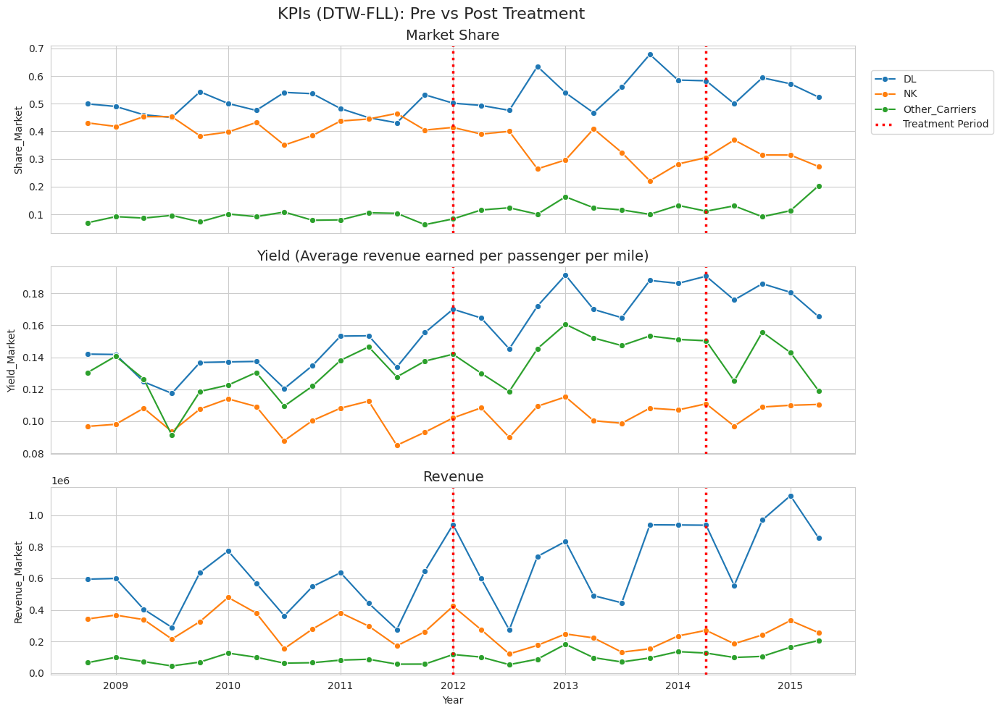

In [ ]:

display(Image(filename=bsts_plots+'/KPIs_Before_After.png'))

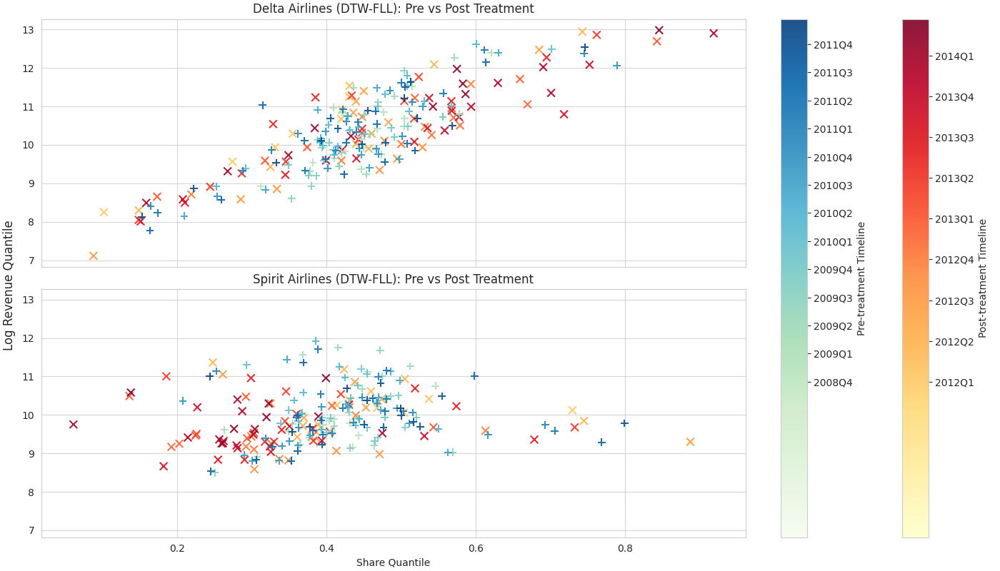

In [ ]:
display(Image(filename=bsts_plots+'/market_revenue_dynamics.png'))

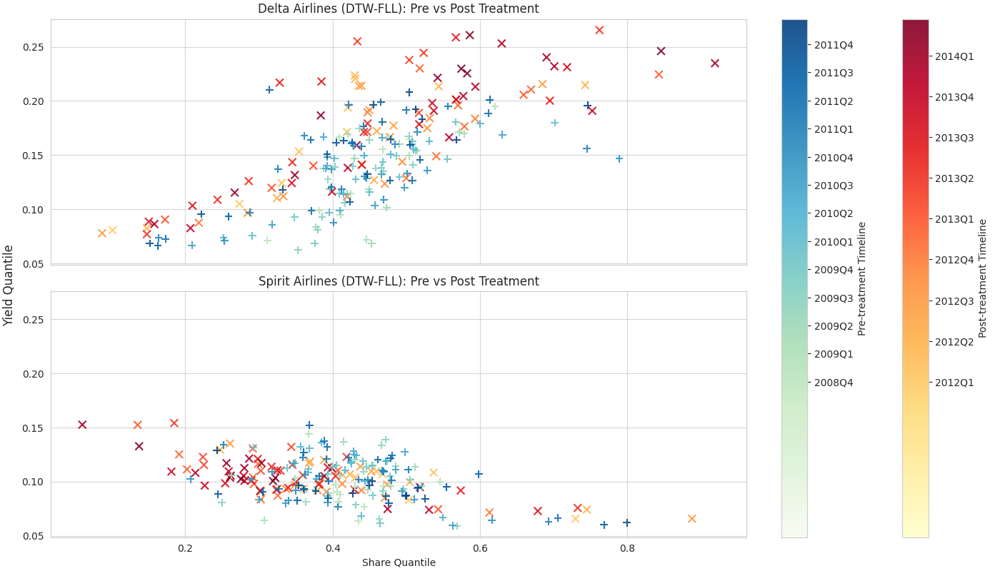

In [ ]:
display(Image(filename=bsts_plots+'/market_yield_dynamics.png'))

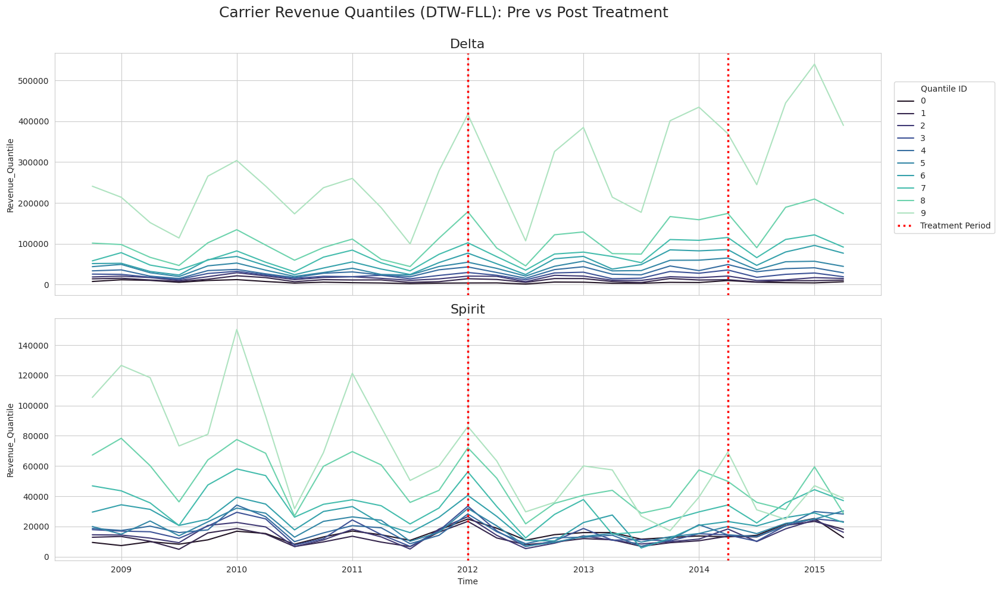

In [ ]:
display(Image(filename=bsts_plots+'/Revenue_Quantile.png'))

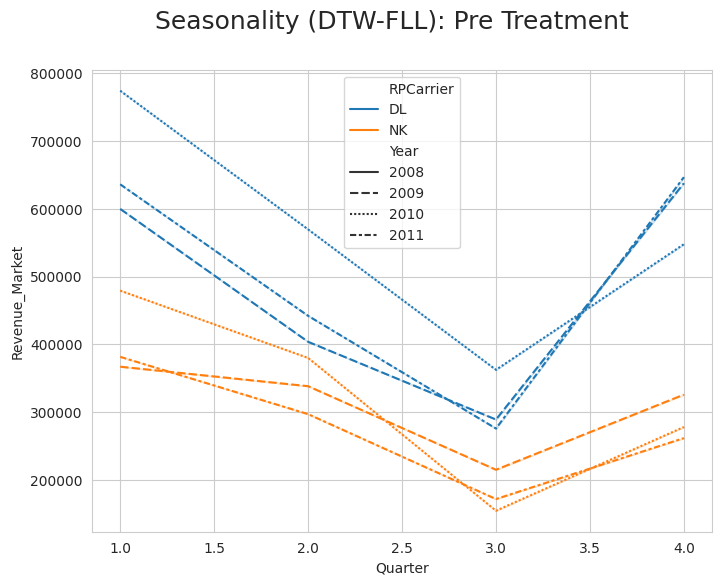

In [ ]:
display(Image(filename=bsts_plots+'/Seasonality.png'))

Here I check for structural changes in our treated units over time which could lead to confounding. We can see that for the most part Delta and Spirit have comparable `MktMilesFlown` and `MktCoupons` on the DFW-FLL route.

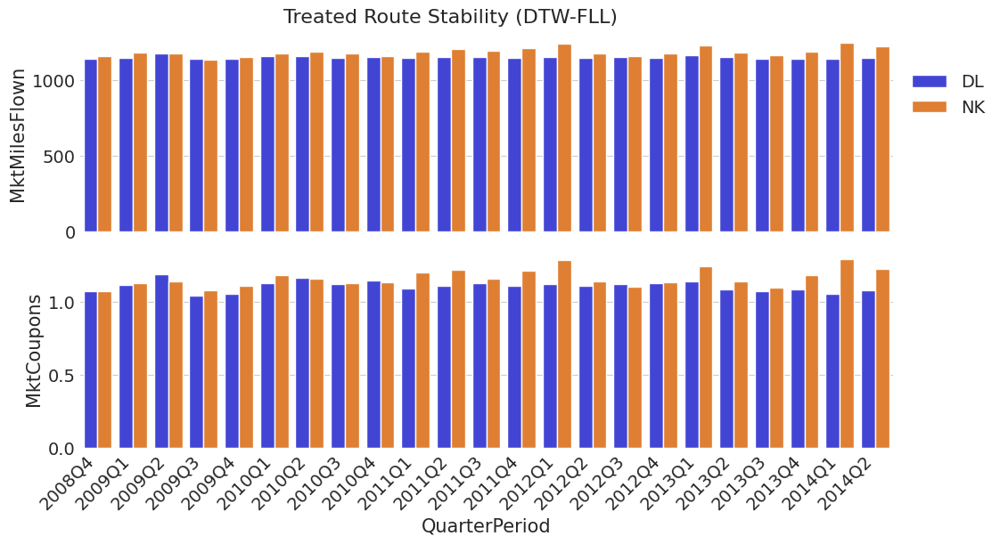

In [ ]:
display(Image(filename=bsts_plots+'/Route_Stability.png'))

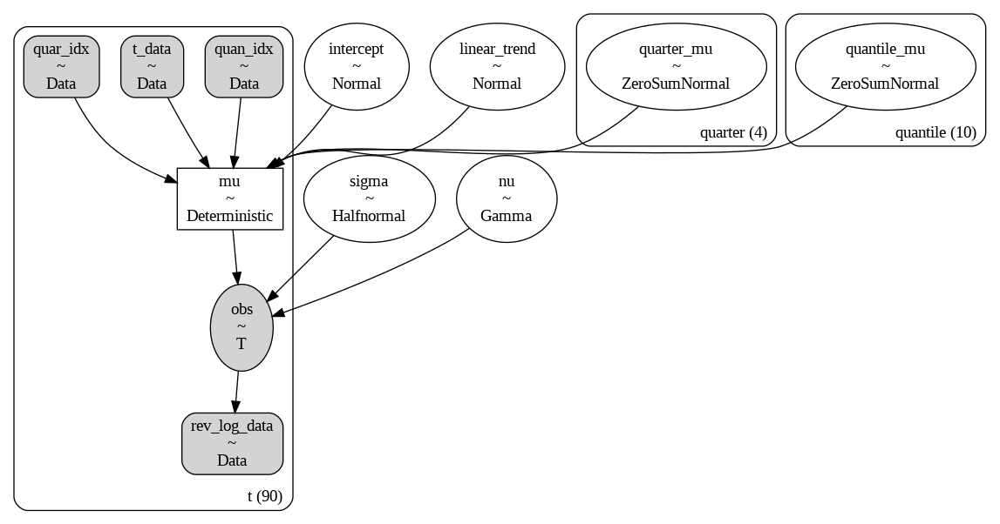

In [ ]:
display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_models/dl_model_graph.png'))

**Data Serialization Strategy**

To reduce computational complexity and model the market structure holistically, the data was transformed from a standard panel format ($T \times N$) into a serialized univariate time series ($T \cdot N \times 1$). Instead of treating the ten price quantiles as ten independent vectors, they were concatenated sequentially within each time step (e.g., 2010-Q1_q0, 2010-Q1_q1 ... 2010-Q1_q9, 2010-Q2_q0...).

**Why this works:**

1. **Market Structure as "Seasonality":** By ordering the data from lowest fare (q0) to highest fare (q9), the inherent shape of the demand curve is transformed into a repeating, periodic signal. The model interprets the fare distribution structure as "intra-quarter seasonality" with a period of 10.

2. **Parameter Efficiency:** This allows the model to learn a single set of global parameters (trend, seasonality) while capturing the spread between quantiles via the seasonal component, rather than estimating ten separate covariance matrices.

In [ ]:
# Data Transformation Logic:
#
# [ Standard Panel Format ]          [ Serialized Time Series ]
# Row 1: Q1 | $100 (q0) | $500 (q9)      t=1:  Q1_q0 ($100)
# Row 2: Q2 | $110 (q0) | $520 (q9)  ->  ...
#                                        t=10: Q1_q9 ($500)
#                                        t=11: Q2_q0 ($110)
#                                        ...
#                                        t=20: Q2_q9 ($520)

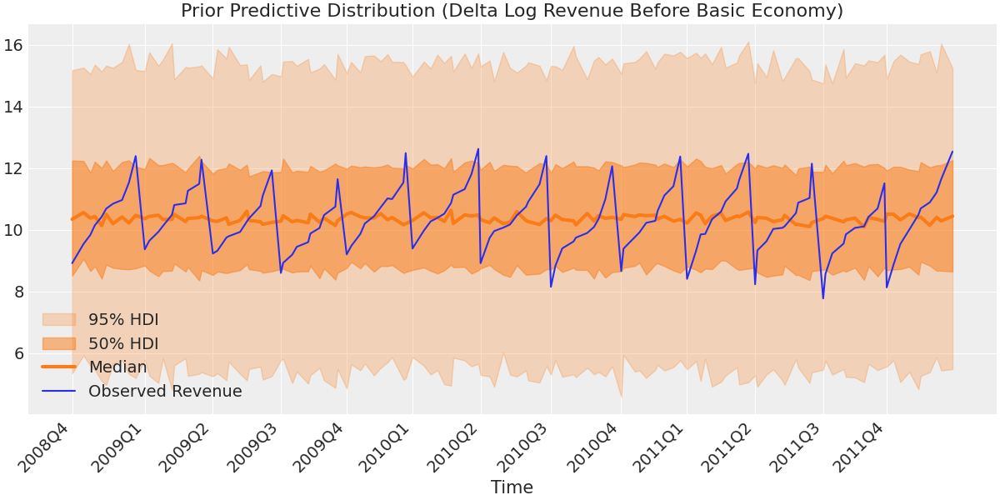

In [ ]:
display(Image(filename=bsts_plots+'/Prior_Predictive_DL.png'))

The distribution of the models’ observations is centered on the actual observations but has more spread. This is useful because we know the priors are not too restrictive and are unlikely to systematically bias our posterior predictions upward or downward.

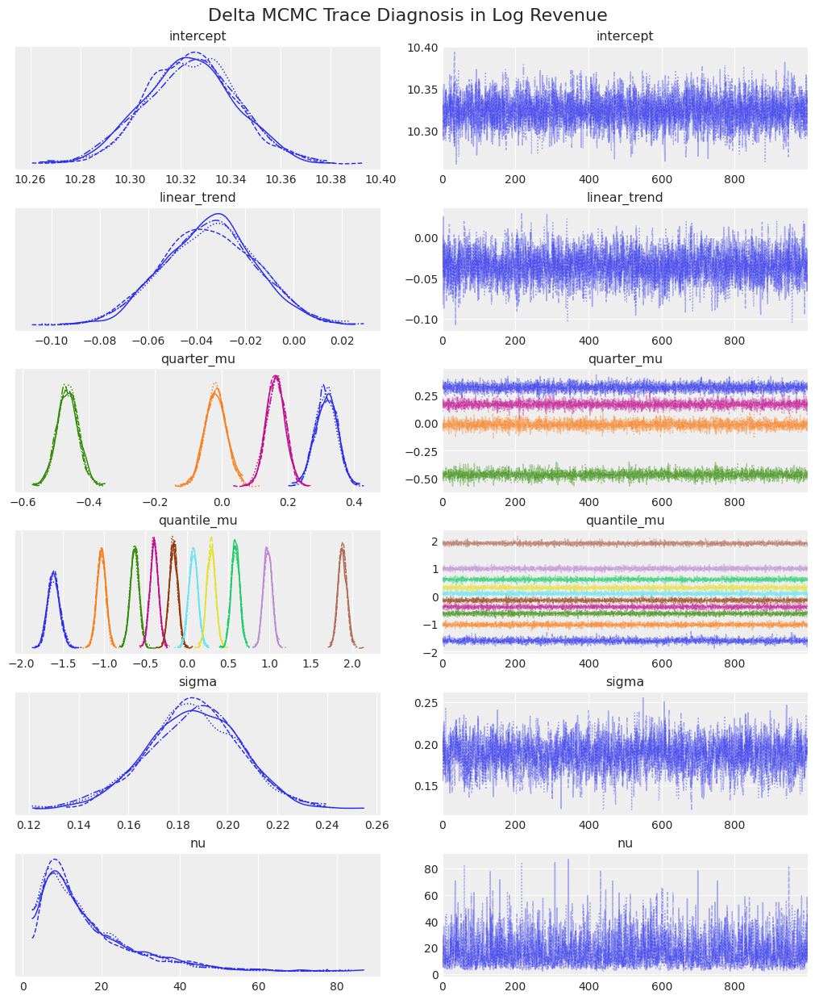

In [ ]:
display(Image(filename=bsts_plots+'/dl_MCMC_trace.png'))

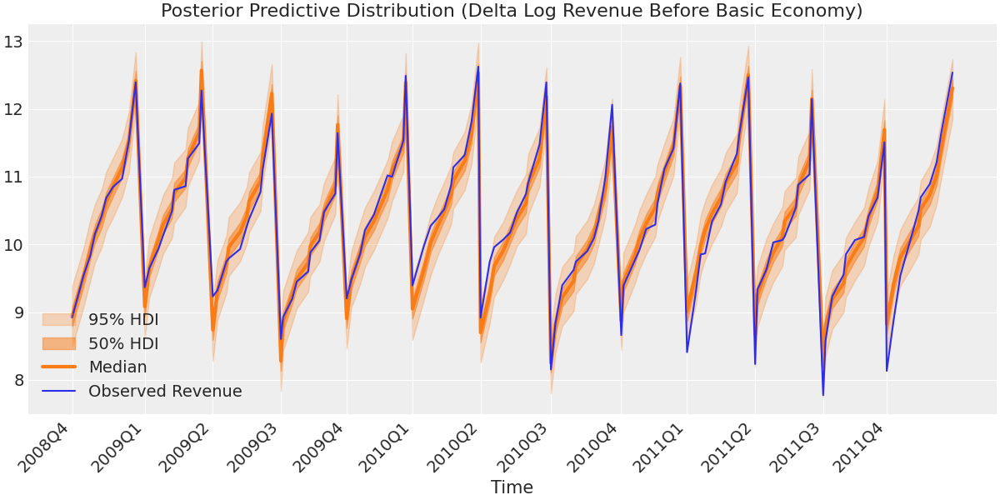

In [ ]:
display(Image(filename=bsts_plots+'/Pretreatment_Posterior_Predictive_DL.png'))

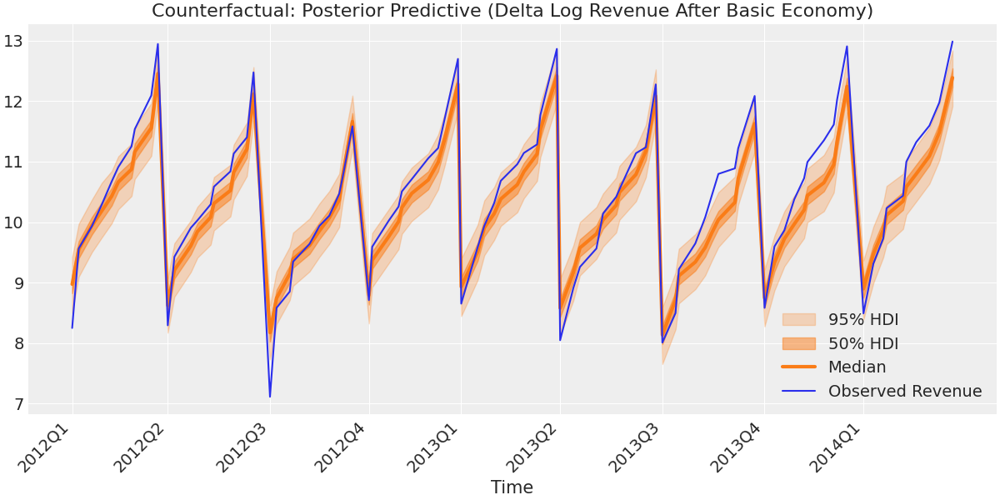

In [ ]:
display(Image(filename=bsts_plots+'/log_Counterfactual_Posterior_Predictive_DL.png'))

For the previous plots, it makes sense to keep things on the log scale so the distributions are clearer. Here, we convert log revenue back into dollars for better interpretability.

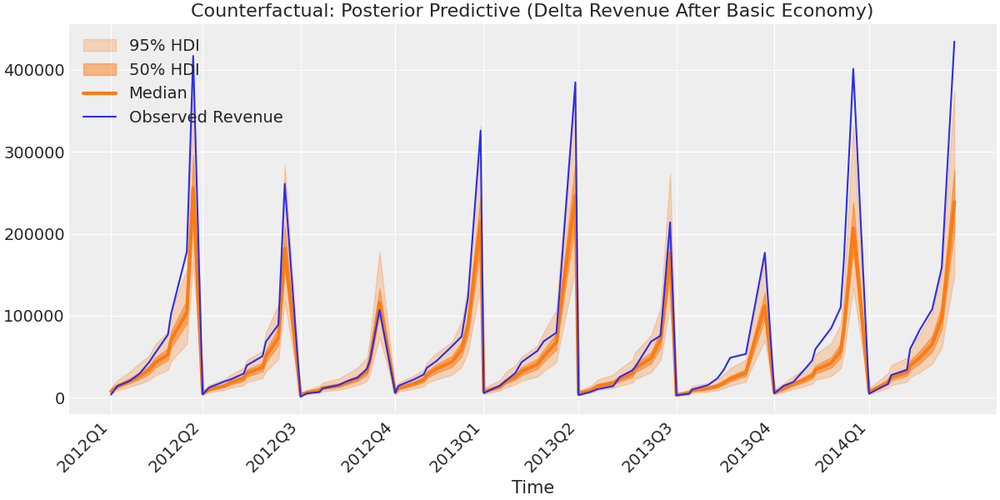

In [ ]:
display(Image(filename=bsts_plots+'/Counterfactual_Posterior_Predictive_DL.png'))

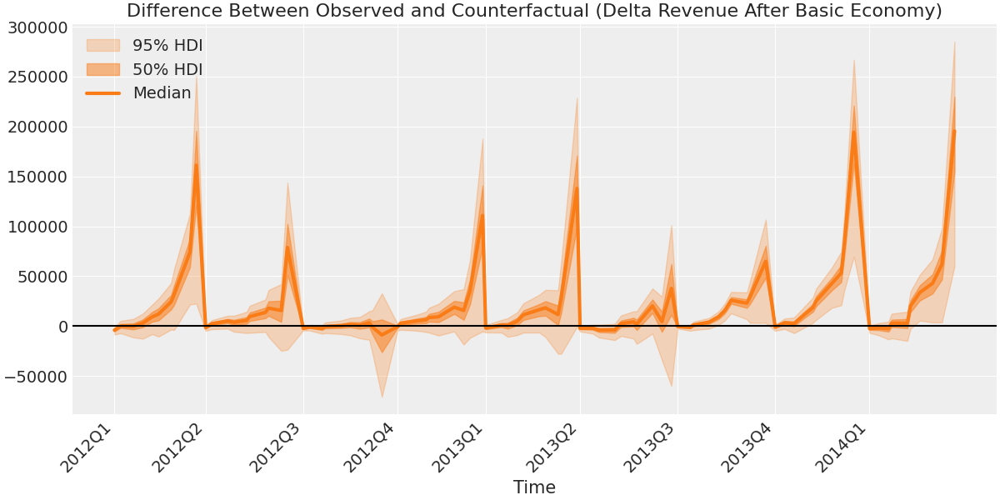

In [ ]:
display(Image(filename=bsts_plots+'/Revenue_Diff_DL.png'))

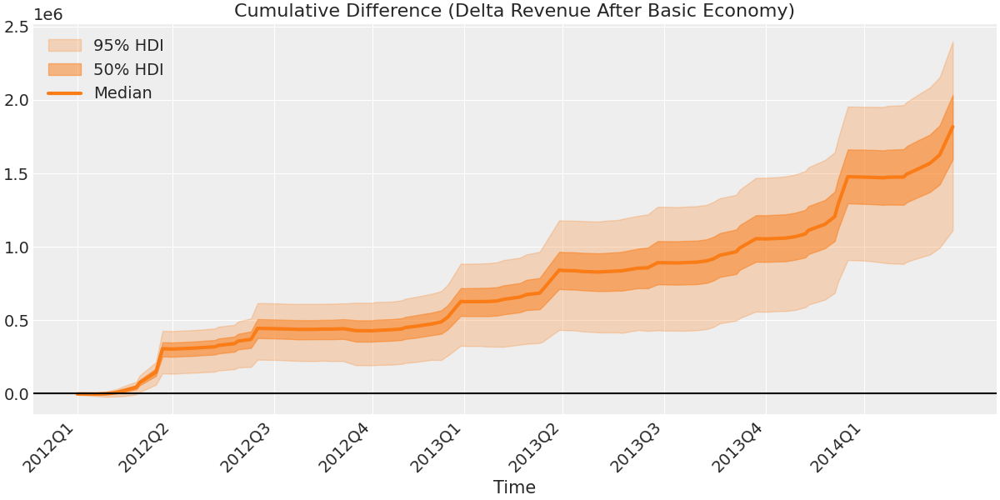

In [ ]:
display(Image(filename=bsts_plots+'/Cumulative_Revenue_DL.png'))

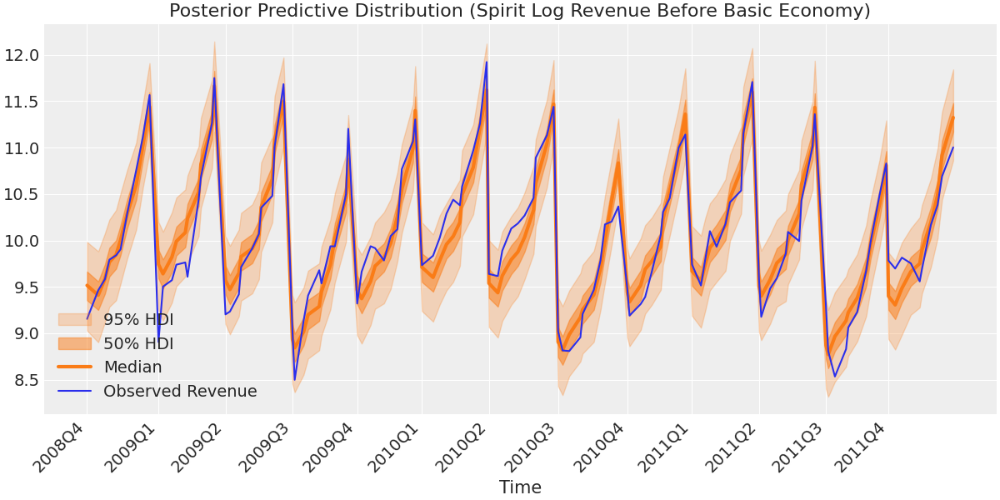

In [ ]:
display(Image(filename=bsts_plots+'/Pretreatment_Posterior_Predictive_NK.png'))

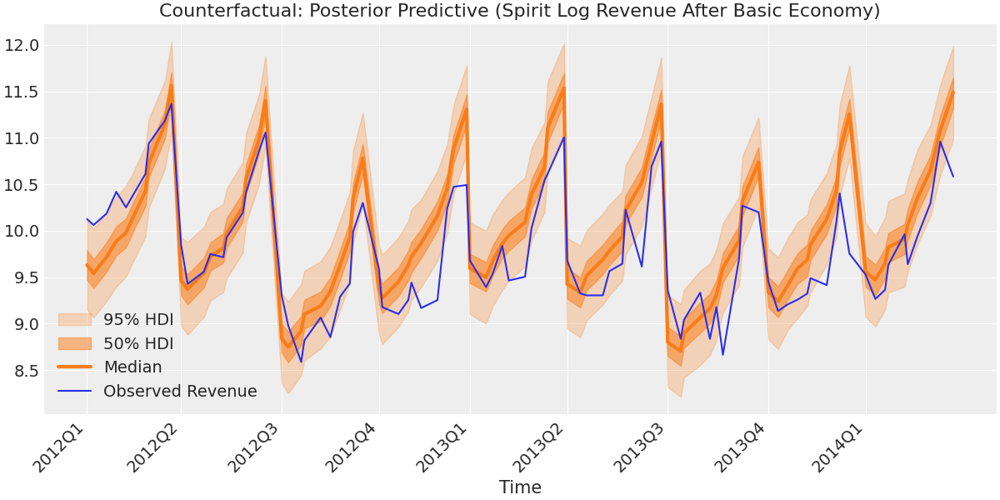

In [ ]:
display(Image(filename=bsts_plots+'/Counterfactual_Posterior_Predictive_NK.png'))

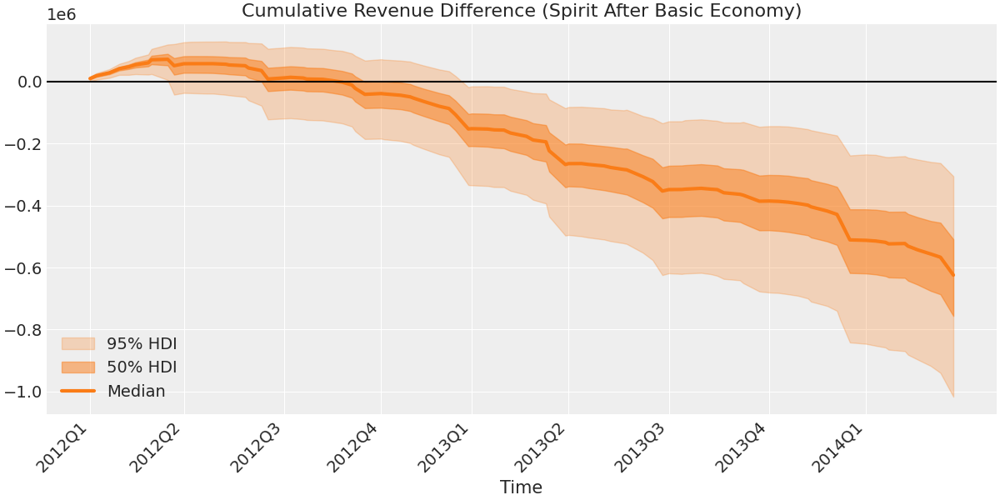

In [ ]:
display(Image(filename=bsts_plots+'/Cumulative_Revenue_NK.png'))

#### 7.2 BSTS Summary

To measure pricing power beyond simple ticket volume, this analysis utilizes a direct financial metric: Total Segment Revenue. This metric aggregates the total revenue generated across ten distinct price quantiles, effectively capturing the area under the market demand curve.

Crucially, this approach isolates Yield Efficiency, allowing us to determine if Delta successfully shifted the entire revenue curve upward (extracting more value per seat across all segments) rather than simply selling more low-fare inventory.

**Delta Causal Impact Summary**

The model detects a statistically significant positive causal effect with near certainty. The segmentation strategy successfully expanded Delta's revenue generation, creating a massive divergence from the counterfactual trend.

- Average Quarterly Lift: ~$200,494 (Total across all segments)

- Cumulative Revenue Impact: $1,804,445

- 94% HDI: [135,263, 270,144] (Strictly Positive)

- Probability of Positive Impact: 100.0%

**Spirit Causal Impact Summary**

In contrast to the previous hypothesis, the model observes a statistically significant negative causal impact on Spirit’s revenue metrics. The credible interval is strictly negative, and the probability of a positive effect is 0%. This suggests that Delta's segmentation strategy exerted successful competitive pressure, effectively capturing revenue share that might have otherwise flowed to the Ultra-Low-Cost Carrier.

- Average Quarterly Lift: ~$70,761 Decrease (Total across all segments)

- Cumulative Revenue Impact: -$636,853

- 94% HDI: [-988,357, -307,741] (Strictly Negative)

- Probability of Positive Impact: 0.0%

### 7.3 Multivariate Synthetic Control

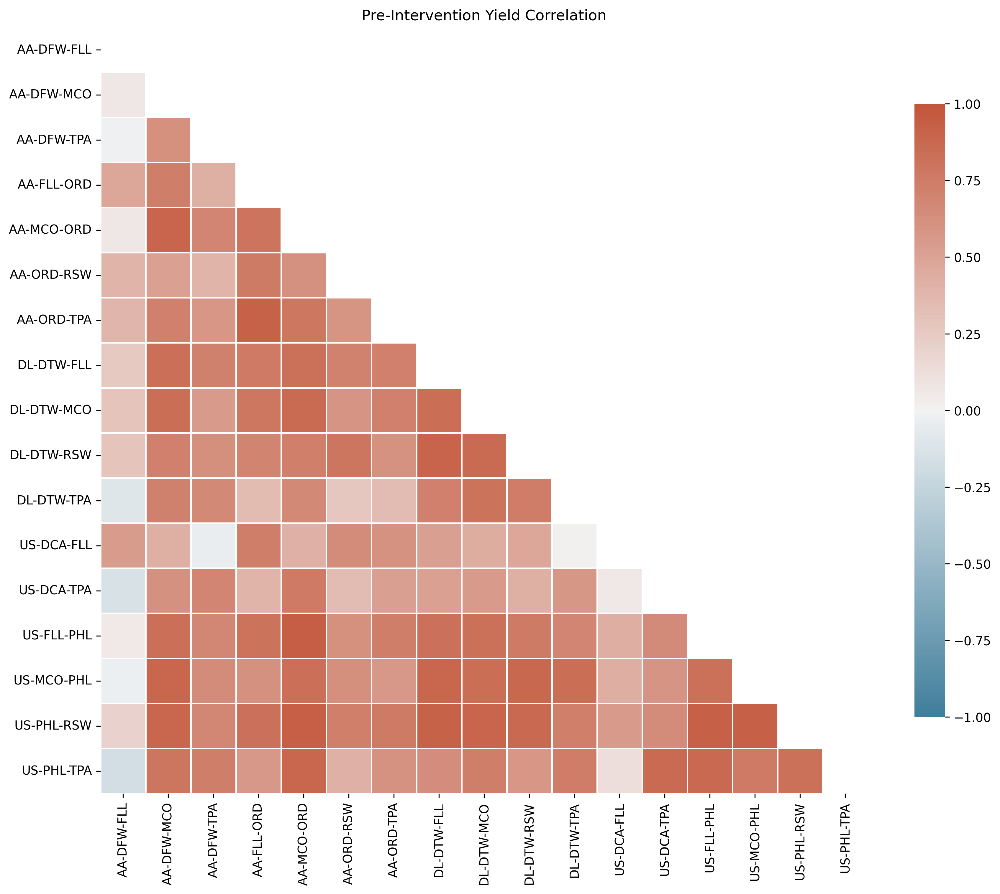

In [ ]:
display(Image(filename=scm_plots+'/Pre-Intervention_Yield_Correlation.png'))

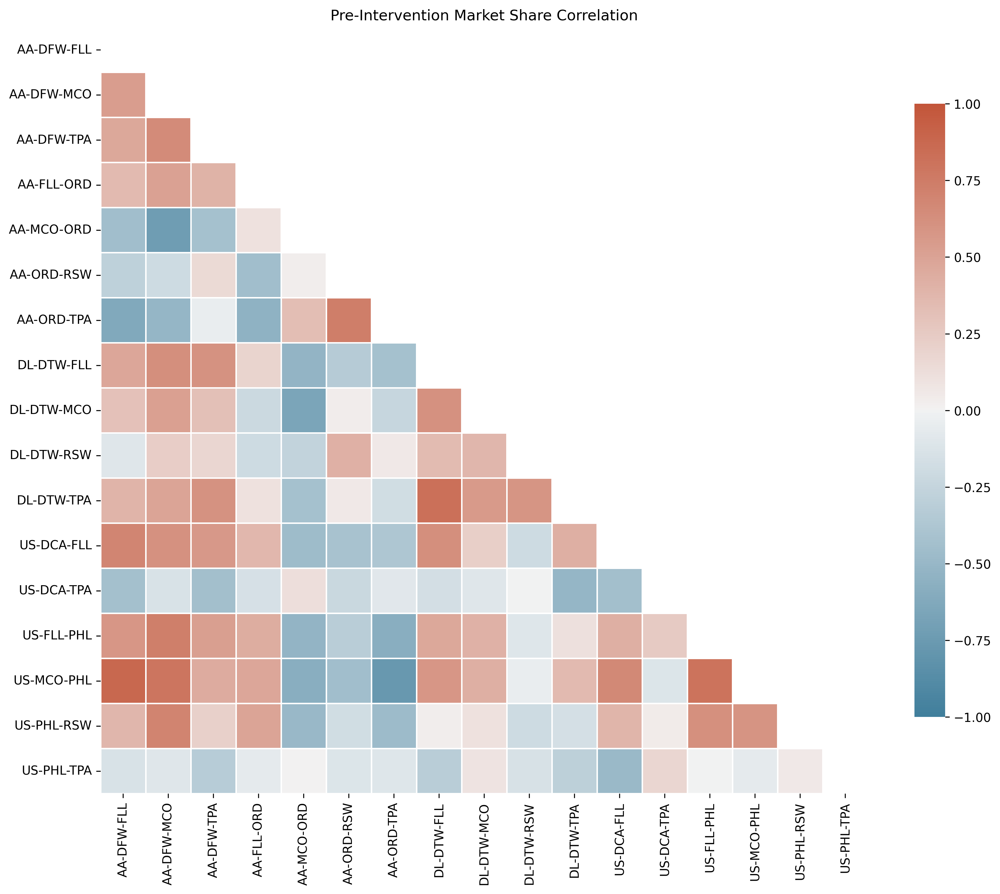

In [ ]:
display(Image(filename=scm_plots+'/Pre-Intervention_Share_Correlation.png'))

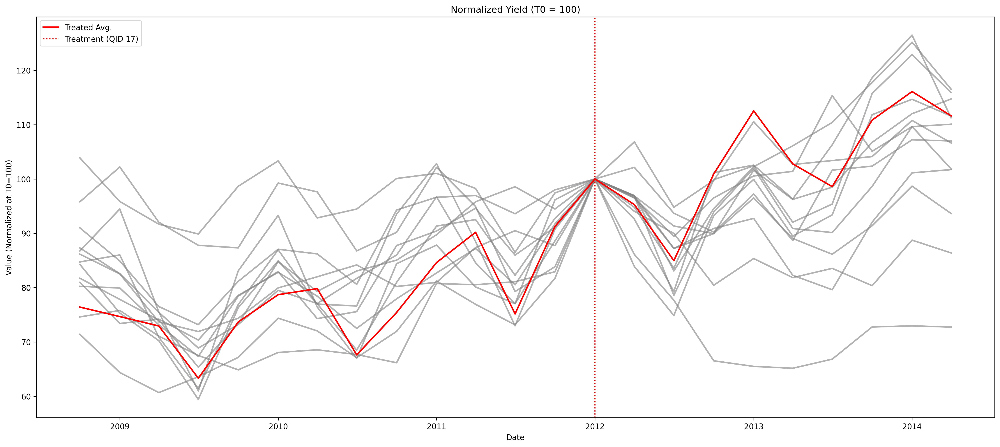

In [ ]:
display(Image(filename=scm_plots+'/Normalized_Yield_Time_Series.png'))

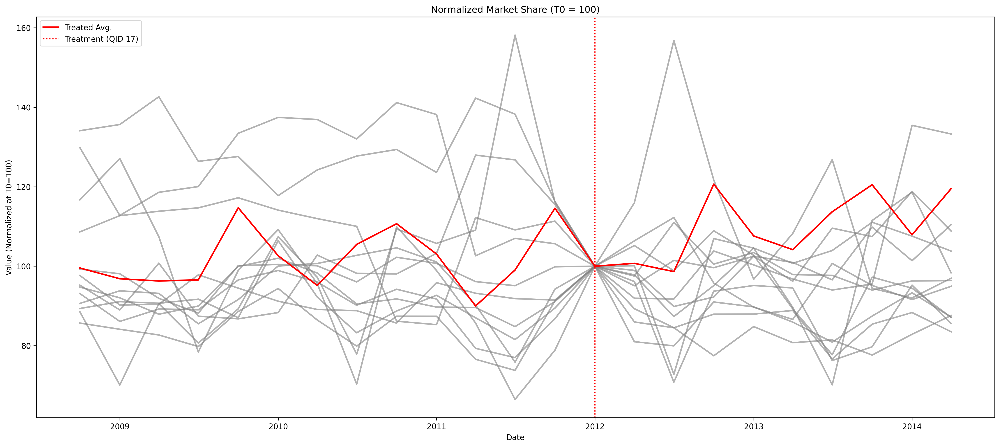

In [ ]:
display(Image(filename=scm_plots+'/Normalized_Share_Time_Series.png'))

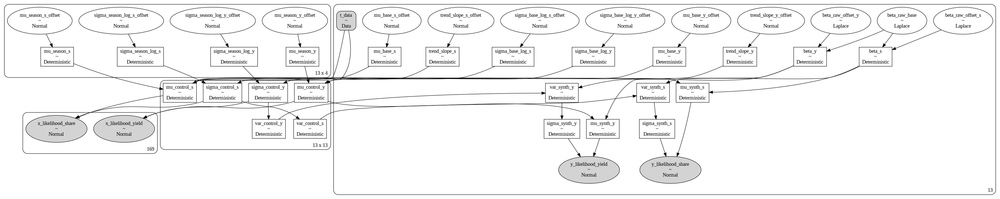

In [ ]:
display(Image(filename='/content/drive/MyDrive/AirlineData/scm_models/scm_model_graph.png'))

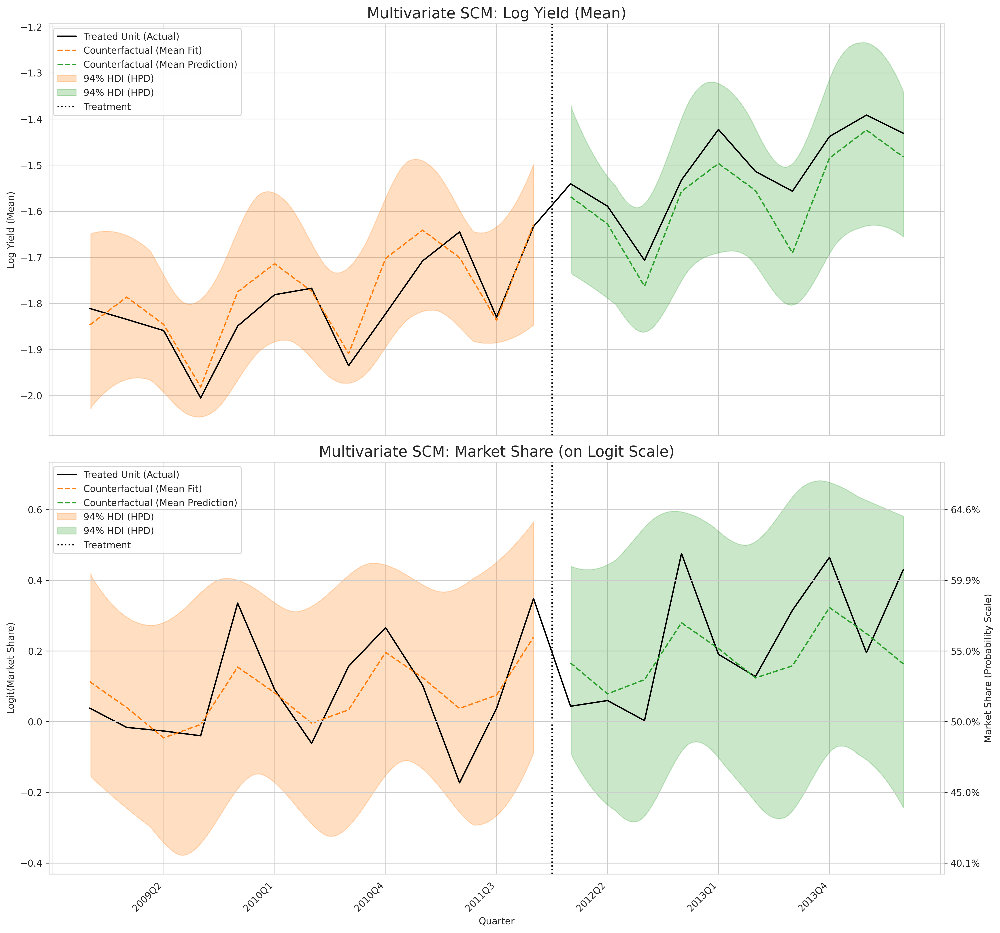

In [ ]:
display(Image(filename=scm_plots+'/scm_results.png'))

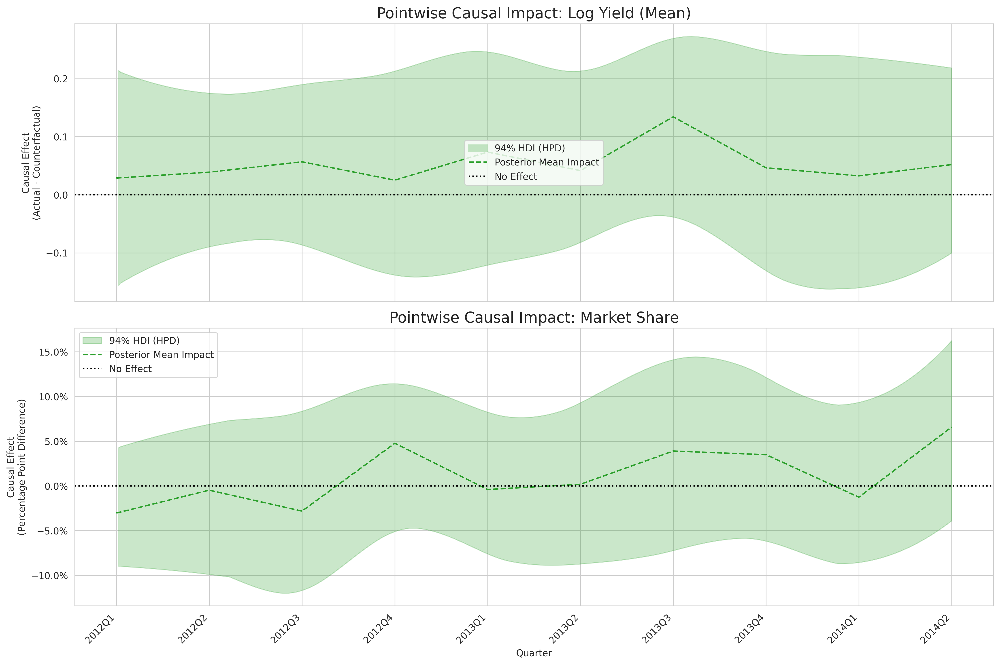

In [ ]:
display(Image(filename=scm_plots+'/causal_impact.png'))

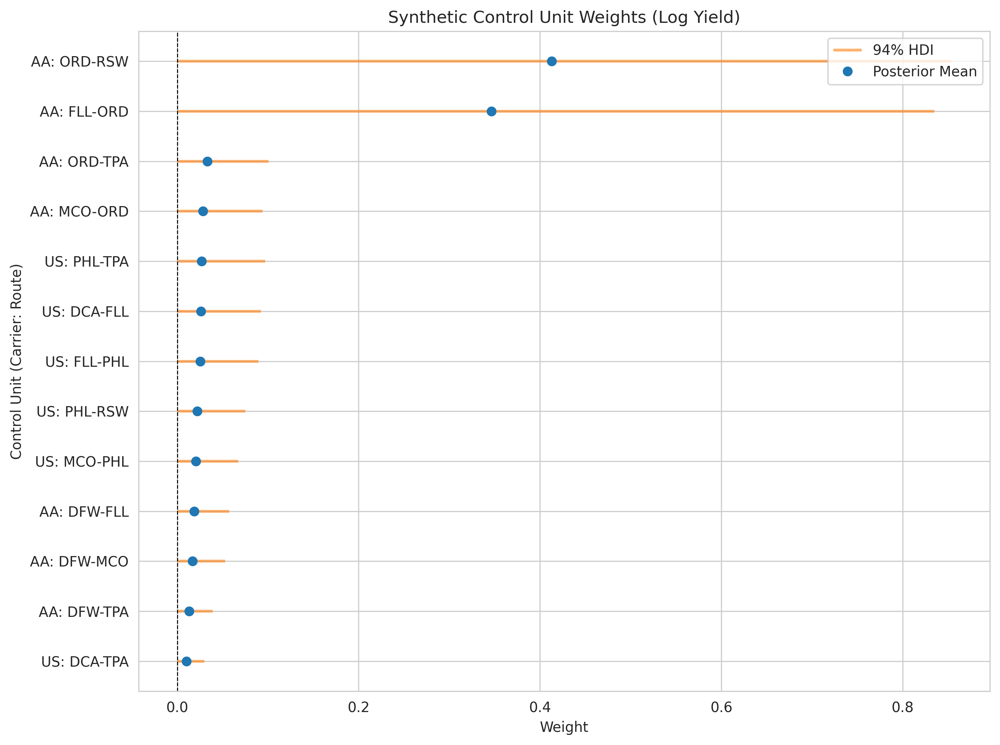

In [ ]:
display(Image(filename=scm_plots+'/yield_control_weights.png'))

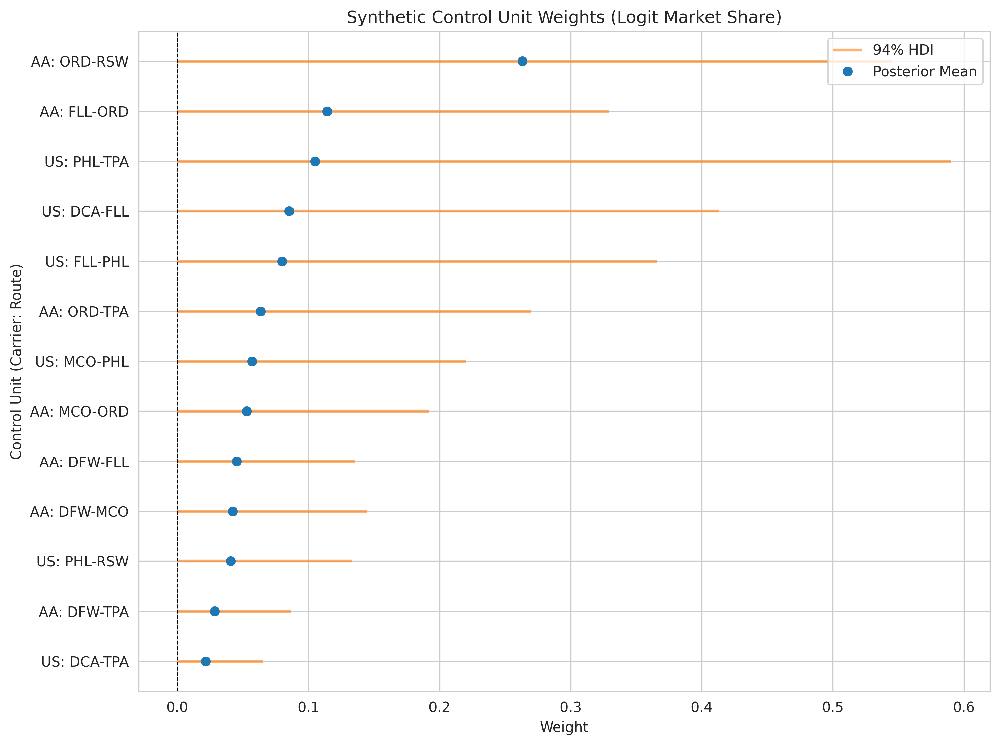

In [ ]:
display(Image(filename=scm_plots+'/share_control_weights.png'))

#### 7.4 SCM Summary

While the Average Treatment Effects do not reach statistical significance at the 94% HDI level, the model demonstrates strong utility in controlling for macroeconomic confounders.

Given that the study period begins in 2008 Q4, a naive model might misattribute post-recession growth to Delta's strategy. As consumer disposable income recovered, demand naturally shifted from low-cost alternatives (like Spirit) toward legacy carriers (the Income Effect). The Synthetic Control model cleanly isolates Delta's strategic impact from this industry-wide recovery by constructing a counterfactual unit from a weighted sum of peers who faced identical macroeconomic conditions.

**Average Treatment Effect (ATT) Summary**

Log Yield:
- Mean Effect: 0.0358
- 94% HDI:     [-0.05489056  0.12243174]

Market Share (Percentage Points):
- Mean Effect: 0.43%
- 94% HDI:     [-0.05318149  0.06540742]
